In this project, I have taken the dataset from the publication of the Sustainable Development Solutions Network, powered by data from the Gallup World Poll and Lloyd’s Register Foundation.

The dataset contains information regarding satisfaction index of countries all around the globe
based on several parameters. We are going to use this dataset to check if and how the life 
satisfaction has changed for people over the years (2015-2020), and we will also see what impact 
covid-19 and world-wide lockdowns had on the happiness level of people around the world.

    
The dataset contains columns that gives us the country names, Life Ladder, Log GDP per capita, 
Social support, Healthy life expectancy at birth (of each country), Freedom to make life choices, 
Perceptions of corruption, Positive affect, Negative affect. Based on this dataset we can check 
which countries have the highest and the lowest overall life-satisfaction and which country had 
the most gradual improvement in their index. 
    
<font color='red'> Data Set: world-happiness-report (source: https://www.kaggle.com/)

#### 1. Load libraries and data into notebook.

#### <font color='green'> a. For Mathematics, Data Analysis and Manipulation

In [1]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')
%pylab inline

Populating the interactive namespace from numpy and matplotlib


#### <font color='green'> b. For Data Visualization

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import random
import plotly.graph_objects as go
import plotly.express as px

#### <font color='green'> c. For Statistics 

In [3]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from  scipy import stats

#### <font color='green'> Import .csv Files

In [4]:
w1=pd.read_csv("./data/report.csv")
w2=pd.read_csv("./data/report-2021.csv")

In [5]:
# Check Dimensions
print(w1.shape)
print(w2.shape)

(1949, 11)
(149, 20)


#### 2. Data Cleaning 

In [6]:
w1.head()
w1.dtypes

Country name                         object
year                                  int64
Life Ladder                         float64
Log GDP per capita                  float64
Social support                      float64
Healthy life expectancy at birth    float64
Freedom to make life choices        float64
Generosity                          float64
Perceptions of corruption           float64
Positive affect                     float64
Negative affect                     float64
dtype: object

In [7]:
w1['year']=w1['year'].astype(int)

In [8]:
w1.drop(columns=['Generosity'],inplace=True)

In [9]:
w1.dtypes

Country name                         object
year                                  int32
Life Ladder                         float64
Log GDP per capita                  float64
Social support                      float64
Healthy life expectancy at birth    float64
Freedom to make life choices        float64
Perceptions of corruption           float64
Positive affect                     float64
Negative affect                     float64
dtype: object

In [10]:
w1.to_csv('w1.csv',index=False)

In [11]:
w2.head()

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.4,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.0,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.4,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798


In [12]:
w2['year']='2021'

In [13]:
w2['year']=w2['year'].astype(int)

In [14]:
w2.dtypes

Country name                                   object
Regional indicator                             object
Ladder score                                  float64
Standard error of ladder score                float64
upperwhisker                                  float64
lowerwhisker                                  float64
Logged GDP per capita                         float64
Social support                                float64
Healthy life expectancy                       float64
Freedom to make life choices                  float64
Generosity                                    float64
Perceptions of corruption                     float64
Ladder score in Dystopia                      float64
Explained by: Log GDP per capita              float64
Explained by: Social support                  float64
Explained by: Healthy life expectancy         float64
Explained by: Freedom to make life choices    float64
Explained by: Generosity                      float64
Explained by: Perceptions of

In [15]:
w2.rename(columns={"Ladder score": "Life Ladder", "Logged GDP per capita": "Log GDP per capita",
                   "Healthy life expectancy":"Healthy life expectancy at birth"},inplace=True)

In [16]:
w2.drop(columns=['Generosity','Regional indicator','Standard error of ladder score',
                 'upperwhisker','lowerwhisker','Ladder score in Dystopia','Explained by: Log GDP per capita',
                 'Explained by: Social support','Explained by: Healthy life expectancy',
                 'Explained by: Freedom to make life choices','Explained by: Perceptions of corruption',
                 'Explained by: Generosity','Dystopia + residual'],inplace=True)

In [17]:
w2.head()

,Country name,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,year
0,Finland,7.842,10.775,0.954,72.0,0.949,0.186,2021
1,Denmark,7.620,10.933,0.954,72.7,0.946,0.179,2021
2,Switzerland,7.571,11.117,0.942,74.4,0.919,0.292,2021
3,Iceland,7.554,10.878,0.983,73.0,0.955,0.673,2021
4,Netherlands,7.464,10.932,0.942,72.4,0.913,0.338,2021


In [18]:
w2.to_csv('w2.csv',index=False)

In [19]:
w = pd.concat(
    map(pd.read_csv, ['w1.csv', 'w2.csv']), ignore_index=True)
w.to_csv('./data/w.csv',index=False)

In [20]:
#Check data types of each column.
w.dtypes

Country name                         object
year                                  int64
Life Ladder                         float64
Log GDP per capita                  float64
Social support                      float64
Healthy life expectancy at birth    float64
Freedom to make life choices        float64
Perceptions of corruption           float64
Positive affect                     float64
Negative affect                     float64
dtype: object

In [21]:
w.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.724,7.370,0.451,50.80,0.718,0.882,0.518,0.258
1,Afghanistan,2009,4.402,7.540,0.552,51.20,0.679,0.850,0.584,0.237
2,Afghanistan,2010,4.758,7.647,0.539,51.60,0.600,0.707,0.618,0.275
3,Afghanistan,2011,3.832,7.620,0.521,51.92,0.496,0.731,0.611,0.267
4,Afghanistan,2012,3.783,7.705,0.521,52.24,0.531,0.776,0.710,0.268


In [22]:
w.tail()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Perceptions of corruption,Positive affect,Negative affect
2093,Lesotho,2021,3.512,7.926,0.787,48.700,0.715,0.915,NaN,NaN
2094,Botswana,2021,3.467,9.782,0.784,59.269,0.824,0.801,NaN,NaN
2095,Rwanda,2021,3.415,7.676,0.552,61.400,0.897,0.167,NaN,NaN
2096,Zimbabwe,2021,3.145,7.943,0.750,56.201,0.677,0.821,NaN,NaN
2097,Afghanistan,2021,2.523,7.695,0.463,52.493,0.382,0.924,NaN,NaN


In [23]:
w.isnull().sum()

Country name                          0
year                                  0
Life Ladder                           0
Log GDP per capita                   36
Social support                       13
Healthy life expectancy at birth     55
Freedom to make life choices         32
Perceptions of corruption           110
Positive affect                     171
Negative affect                     165
dtype: int64

In [24]:
w['Log GDP per capita']=w['Log GDP per capita'].fillna(0)
w['Social support']=w['Social support'].fillna(0)
w['Healthy life expectancy at birth']=w['Healthy life expectancy at birth'].fillna(0)
w['Freedom to make life choices']=w['Freedom to make life choices'].fillna(0)
w['Perceptions of corruption']=w['Perceptions of corruption'].fillna(0)
w['Positive affect']=w['Positive affect'].fillna(0)
w['Negative affect']=w['Negative affect'].fillna(0)

In [25]:
w.isnull().sum()

Country name                        0
year                                0
Life Ladder                         0
Log GDP per capita                  0
Social support                      0
Healthy life expectancy at birth    0
Freedom to make life choices        0
Perceptions of corruption           0
Positive affect                     0
Negative affect                     0
dtype: int64

In [26]:
w.columns = w.columns.str.replace(' ','_',regex=True)

In [27]:
w['Years']=w.year

w.set_index('year', inplace=True)

In [28]:
w.head()

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2008,Afghanistan,3.724,7.370,0.451,50.80,0.718,0.882,0.518,0.258,2008
2009,Afghanistan,4.402,7.540,0.552,51.20,0.679,0.850,0.584,0.237,2009
2010,Afghanistan,4.758,7.647,0.539,51.60,0.600,0.707,0.618,0.275,2010
2011,Afghanistan,3.832,7.620,0.521,51.92,0.496,0.731,0.611,0.267,2011
2012,Afghanistan,3.783,7.705,0.521,52.24,0.531,0.776,0.710,0.268,2012


In [29]:
# Seggragating data year wise

year2005=w.loc[2005]
year2006=w.loc[2006]
year2007=w.loc[2007]
year2008=w.loc[2008]
year2009=w.loc[2009]
year2010=w.loc[2010]
year2011=w.loc[2011]
year2012=w.loc[2012]
year2013=w.loc[2013]
year2014=w.loc[2014]
year2015=w.loc[2015]
year2016=w.loc[2016]
year2017=w.loc[2017]
year2018=w.loc[2018]
year2019=w.loc[2019]
year2020=w.loc[2020]
year2021=w.loc[2021]


year2005.to_csv(r'./data/year2005.csv')
year2006.to_csv(r'./data/year2006.csv')
year2007.to_csv(r'./data/year2007.csv')
year2008.to_csv(r'./data/year2008.csv')
year2009.to_csv(r'./data/year2009.csv')
year2010.to_csv(r'./data/year2010.csv')
year2011.to_csv(r'./data/year2011.csv')
year2012.to_csv(r'./data/year2012.csv')
year2013.to_csv(r'./data/year2013.csv')
year2014.to_csv(r'./data/year2014.csv')
year2015.to_csv(r'./data/year2015.csv')
year2016.to_csv(r'./data/year2016.csv')
year2017.to_csv(r'./data/year2017.csv')
year2018.to_csv(r'./data/year2018.csv')
year2019.to_csv(r'./data/year2019.csv')
year2020.to_csv(r'./data/year2020.csv')
year2021.to_csv(r'./data/year2021.csv')

### Insights

#### <font color='green'> 1. Top 10 countries with highest and lowest Log GDP per capita in 2005.


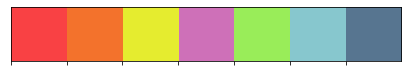

In [30]:
color=["#f94144","#f3722c","#E5EC2F","#CE70B8","#99ED59","#87C7CE","#577590"]
sns.palplot(color)

In [31]:
log=year2005.sort_values(by=['Log_GDP_per_capita'],ascending=False, inplace=False)


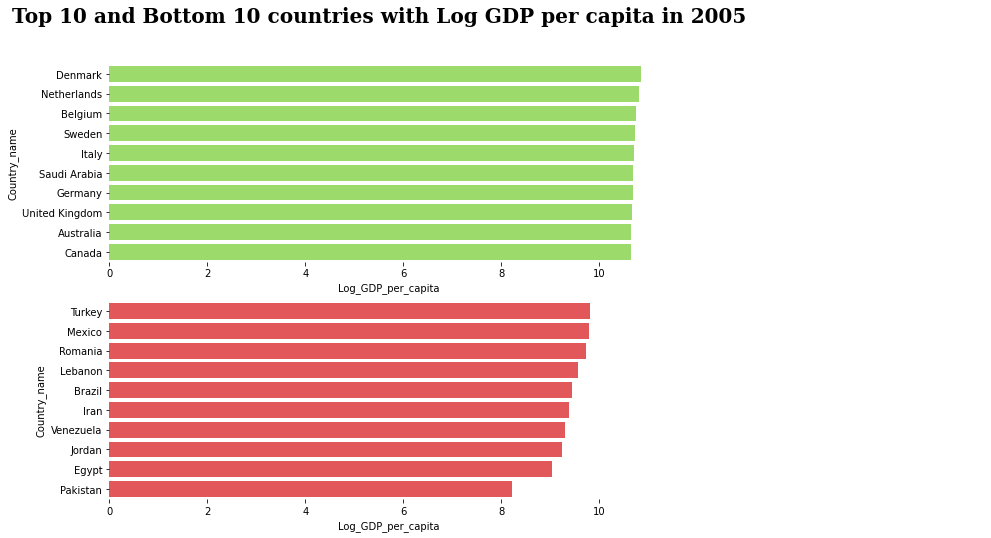

In [32]:
fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Log GDP per capita in 2005", family='Serif', weight='bold', size=20)
top_10=log.head(10)
bot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=top_10, x=top_10['Log_GDP_per_capita'],y=top_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Log GDP per capita",xy=(12,0), family='Serif', weight='bold', size=11)




plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=bot_10, x=bot_10['Log_GDP_per_capita'],y=bot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Log GDP per capita",xy=(12,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)

In [33]:
log=year2005.sort_values(by=['Healthy_life_expectancy_at_birth'],ascending=False, inplace=False)

#### <font color='green'> 2. Top 10 countries with highest and lowest Healthy life expectancy at birth.

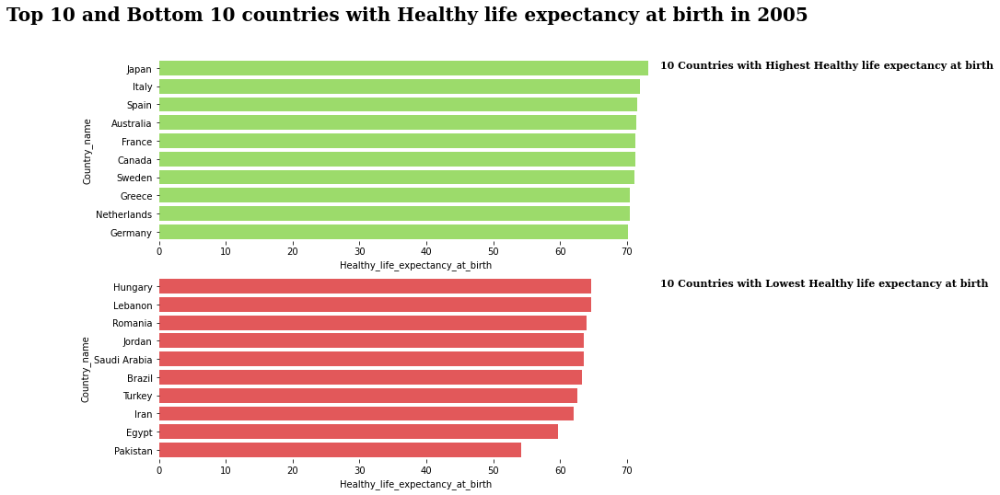

In [34]:
fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Healthy life expectancy at birth in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Healthy_life_expectancy_at_birth'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Healthy life expectancy at birth",xy=(75,0), family='Serif', weight='bold', size=11)




plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Healthy_life_expectancy_at_birth'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Healthy life expectancy at birth",xy=(75,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)

In [35]:
log=year2005.sort_values(by=['Social_support'],ascending=False, inplace=False)

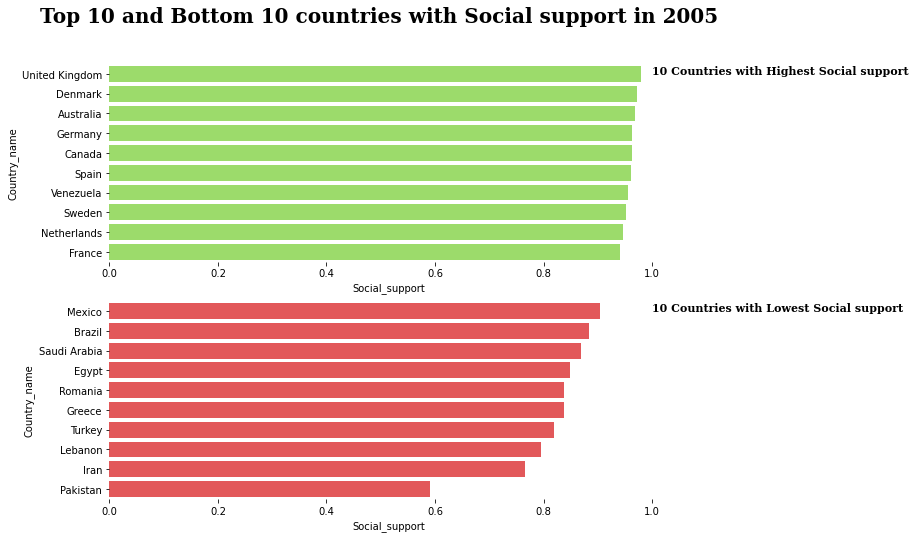

In [36]:
fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Social support in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Social_support'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Social support",xy=(1,0), family='Serif', weight='bold', size=11)




plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Social_support'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Social support",xy=(1,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)

In [37]:
log=year2005.sort_values(by=['Freedom_to_make_life_choices'],ascending=False, inplace=False)

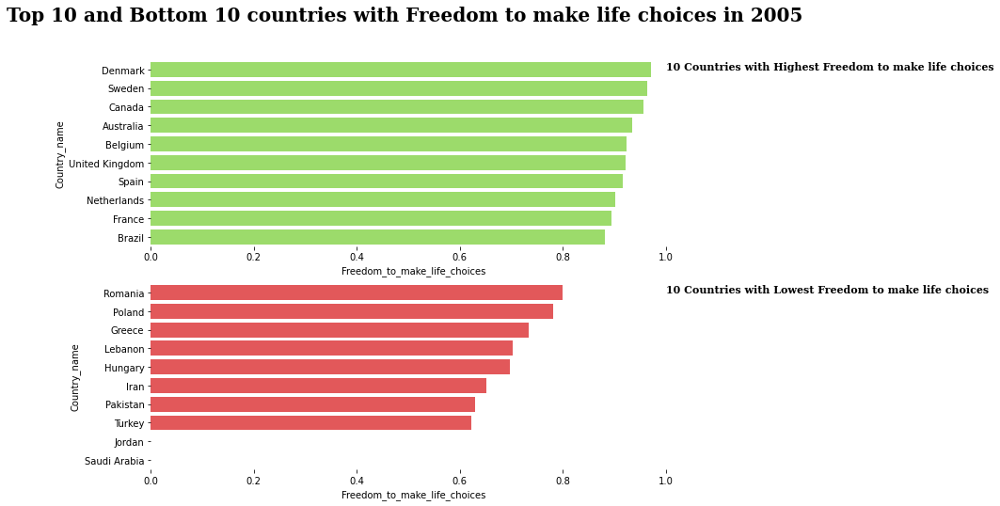

In [38]:
fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Freedom to make life choices in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Freedom_to_make_life_choices'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Freedom to make life choices",xy=(1,0), family='Serif', weight='bold', size=11)




plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Freedom_to_make_life_choices'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Freedom to make life choices",xy=(1,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)

In [39]:
log=year2005.sort_values(by=['Perceptions_of_corruption'],ascending=False, inplace=False)


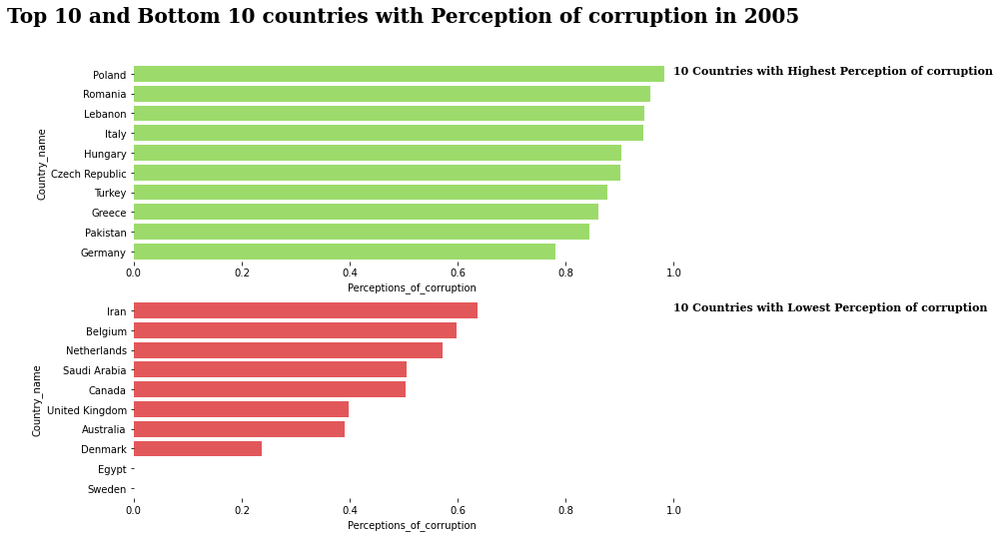

In [40]:

fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Perception of corruption in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Perceptions_of_corruption'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Perception of corruption",xy=(1,0), family='Serif', weight='bold', size=11)




plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Perceptions_of_corruption'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Perception of corruption",xy=(1,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)
	

In [41]:
log=year2005.sort_values(by=['Positive_affect'],ascending=False, inplace=False)

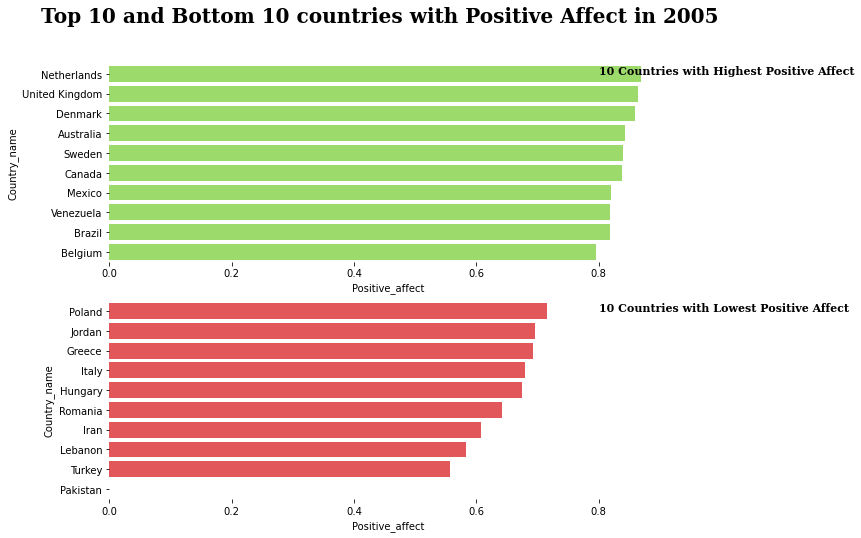

In [42]:

fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Positive Affect in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Positive_affect'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Positive Affect",xy=(0.8,0), family='Serif', weight='bold', size=11)


plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Positive_affect'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Positive Affect",xy=(0.8,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)
	

In [43]:
log=year2005.sort_values(by=['Negative_affect'],ascending=False, inplace=False)

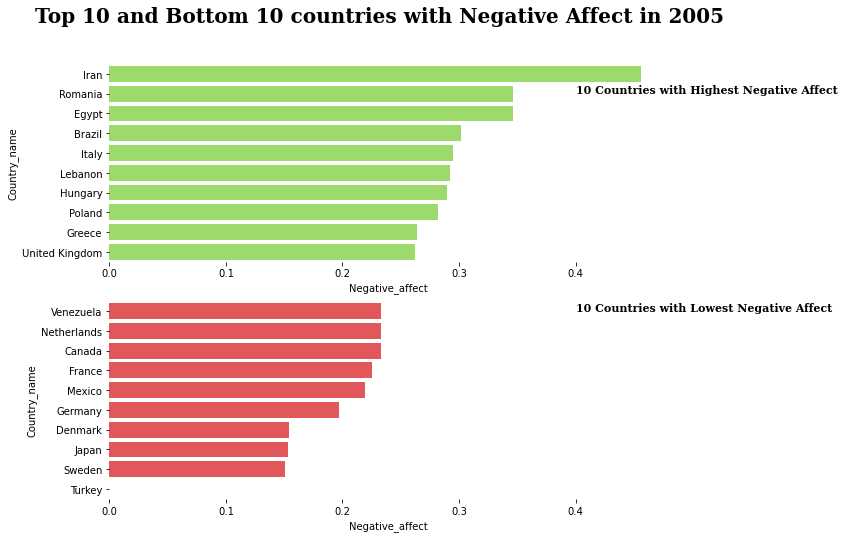

In [44]:
fig= plt.figure(figsize=(10,8))
g=gs.GridSpec(ncols=1, nrows=2, figure=fig)
plt.suptitle("Top 10 and Bottom 10 countries with Negative Affect in 2005", family='Serif', weight='bold', size=20)
hletop_10=log.head(10)
hlebot_10=log.tail(10)

plot1=plt.subplot(g[0,0])
plot1=sns.barplot(data=hletop_10, x=hletop_10['Negative_affect'],y=hletop_10['Country_name'], color=color[4])
plot1.annotate("10 Countries with Highest Negative Affect",xy=(0.4,1), family='Serif', weight='bold', size=11)

plot2=plt.subplot(g[1,0], sharex=plot1)
plot2=sns.barplot(data=hlebot_10, x=hlebot_10['Negative_affect'],y=hlebot_10['Country_name'], color=color[0])
plot2.annotate("10 Countries with Lowest Negative Affect",xy=(0.4,0), family='Serif', weight='bold', size=11)


for s in ['left','right','top','bottom']:
    plot1.spines[s].set_visible(False)
    plot2.spines[s].set_visible(False)

#### <font color='green'>3. Scatterplot of Life Ladder vs Countries between 2005 to 2021

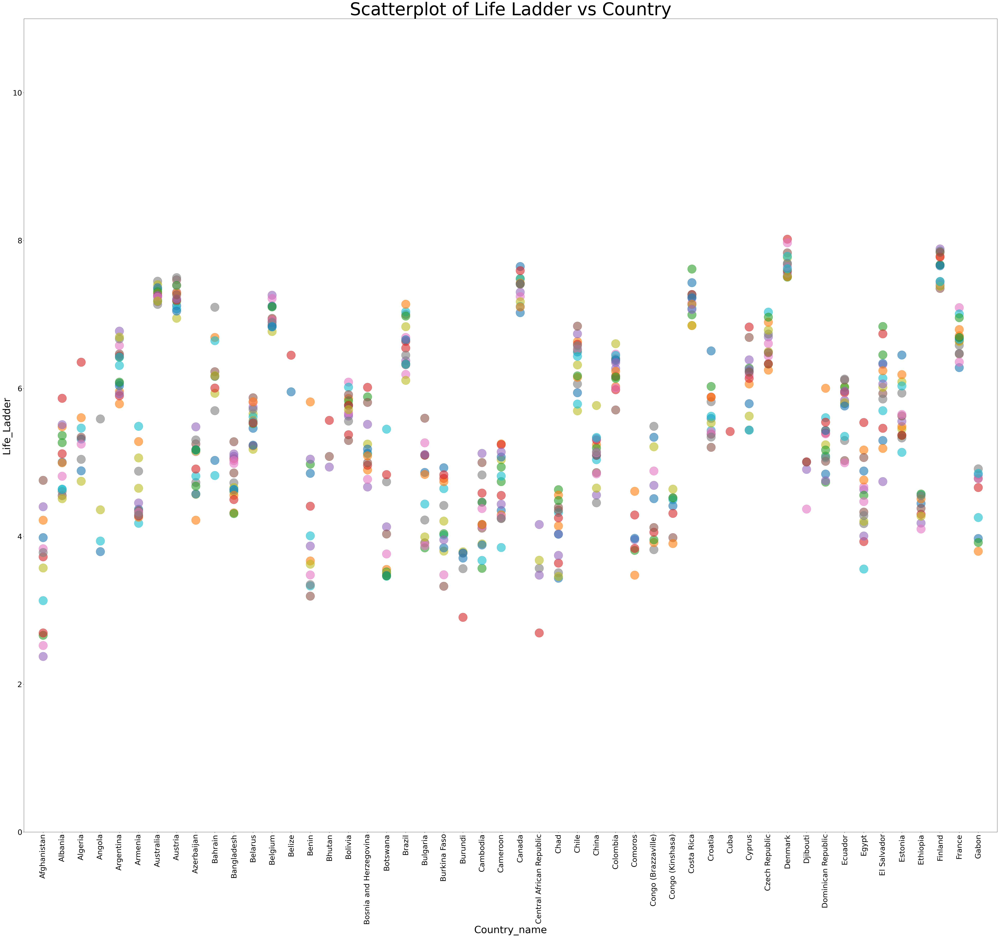

In [45]:
log=w.sort_values(by=['Country_name'],ascending=False, inplace=False)

c = np.unique(w['Years'])
con=np.unique(log.Country_name)
con1=con[0:50,]
colors = [plt.cm.tab10(i/float(len(c)-1)) for i in range(len(c))]

plt.figure(figsize=(70,60), dpi= 100, facecolor='w', edgecolor='k')

for j, Country_name in enumerate(con1):
    for i, Years in enumerate(c):
        cat1=log.loc[log.Country_name==Country_name,:]
        cat=cat1.loc[cat1.Years==Years,:]
        plt.scatter('Country_name','Life_Ladder',data=cat,
                s=1200,cmap=colors,alpha=0.6)
        
# Decorations
plt.gca().set(xlim=(-1,50), ylim=(0,11),
              xlabel='Country_name', ylabel='Life_Ladder')

plt.xticks(con1,rotation='vertical',fontsize=30); plt.yticks(fontsize=30)
plt.title("Scatterplot of Life Ladder vs Country", fontsize=70)
plt.xlabel("Country_name",fontsize=40)
plt.ylabel("Life_Ladder",fontsize=40)
# plt.legend(fontsize=20)    
plt.show() 


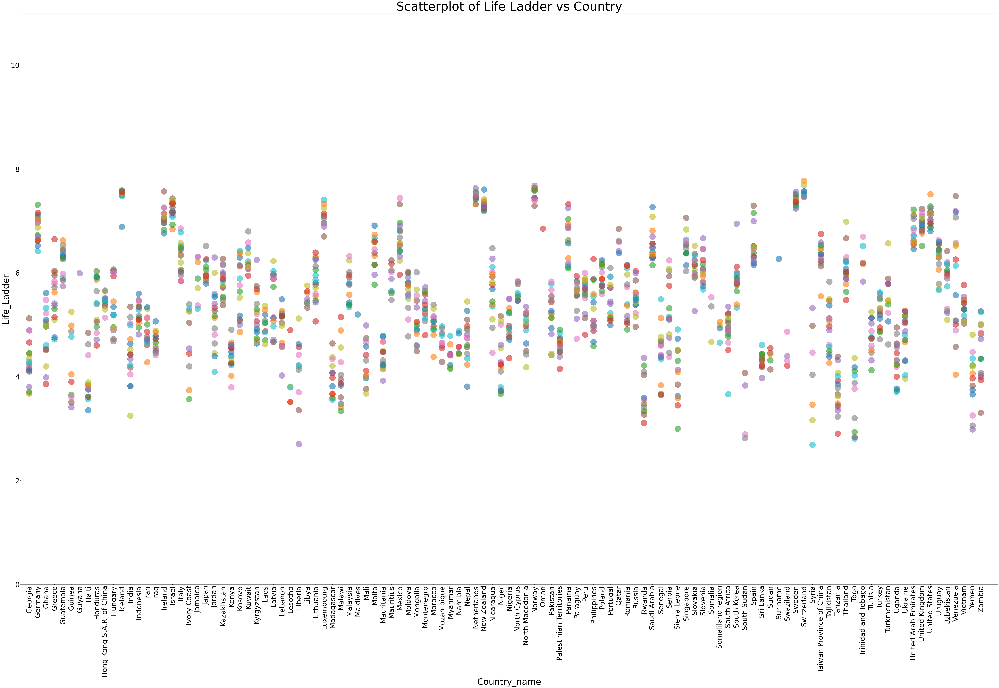

In [46]:
con1=con[51:165,]
colors = [plt.cm.tab10(i/float(len(c)-1)) for i in range(len(c))]


plt.figure(figsize=(100,60), dpi= 100, facecolor='w', edgecolor='k')

for j, Country_name in enumerate(con1):
    for i, Years in enumerate(c):
        cat1=log.loc[log.Country_name==Country_name,:]
        cat=cat1.loc[cat1.Years==Years,:]
        plt.scatter('Country_name','Life_Ladder',data=cat,
                s=1200,cmap=colors[i],alpha=0.6)
        

        
# Decorations
plt.gca().set(xlim=(-1,115), ylim=(0,11),
              xlabel='Country_name', ylabel='Life_Ladder')

plt.xticks(con1,rotation='vertical',fontsize=40); plt.yticks(fontsize=40)
plt.title("Scatterplot of Life Ladder vs Country", fontsize=70)
plt.xlabel("Country_name",fontsize=50)
plt.ylabel("Life_Ladder",fontsize=50)
# plt.legend(fontsize=20)    
plt.show() 


### <font color='green'> Heatmap for Average Life Ladder for all countries between the time span of 2005 till 2021

Text(345.72222222222223, 0.5, 'Country Name')

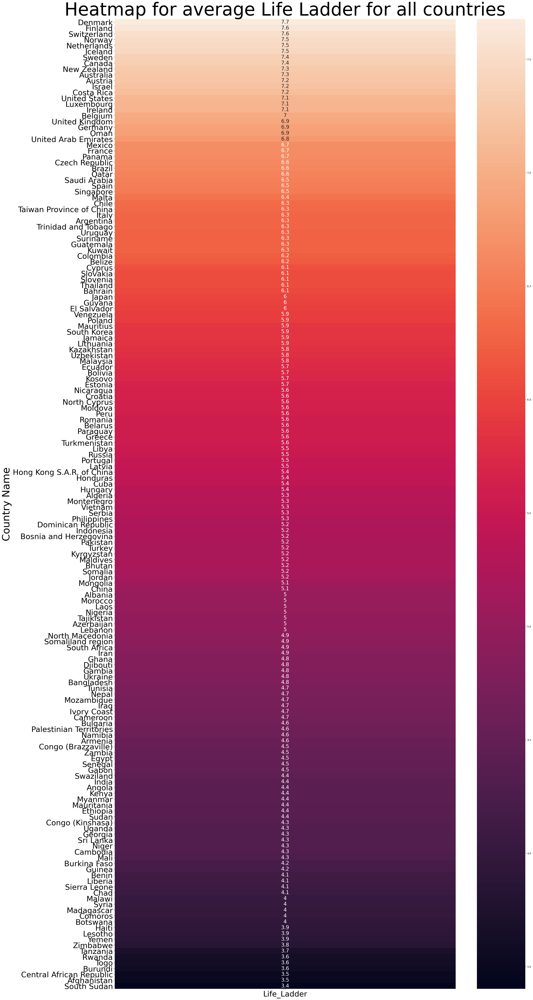

In [47]:
pd.options.display.max_rows=None

mean_life_ladder=w.pivot_table(index=['Country_name'], values=['Life_Ladder'], aggfunc='mean').sort_values(by=['Life_Ladder'],ascending=False, inplace=False)
# mean_life_ladder

plt.figure(figsize=(30,70), dpi= 100, facecolor='w', edgecolor='k')
sns.heatmap(data=mean_life_ladder, annot=True,annot_kws={"size": 20})

plt.xticks(fontsize=30); plt.yticks(fontsize=30)
plt.title("Heatmap for average Life Ladder for all countries", fontsize=70)
plt.ylabel("Country Name",fontsize=40)


In [48]:
w[w.Country_name=='Denmark']

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2005,Denmark,8.019,10.851,0.972,69.60,0.971,0.237,0.860,0.154,2005
2007,Denmark,7.834,10.891,0.954,69.92,0.932,0.206,0.828,0.194,2007
2008,Denmark,7.971,10.880,0.954,70.08,0.970,0.248,0.757,0.163,2008
2009,Denmark,7.683,10.824,0.939,70.24,0.949,0.206,0.749,0.234,2009
2010,Denmark,7.771,10.839,0.975,70.40,0.944,0.175,0.785,0.155,2010
2011,Denmark,7.788,10.848,0.962,70.62,0.935,0.220,0.769,0.175,2011
2012,Denmark,7.520,10.846,0.951,70.84,0.933,0.187,0.774,0.209,2012
2013,Denmark,7.589,10.851,0.965,71.06,0.920,0.170,0.862,0.195,2013
2014,Denmark,7.508,10.862,0.956,71.28,0.942,0.237,0.832,0.233,2014


In [49]:
firstW=['Australia','Austria','Belgium','Canada','Denmark','France','Germany','Greece','Iceland','Ireland','Israel','Italy','Japan','Luxembourg','Netherlands','New Zealand','Norway','Portugal','South Korea','Spain','Sweden','Switzerland','Turkey','United Kingdom','United States']
secondW=['Albania','Armenia','Azerbaijan','Belarus','Bosnia and Herzegovina','Bulgaria','Croatia','Czech Republic','Estonia','Georgia','East Germany','Hungary','Kazakhstan','Kyrgyzstan','Latvia','Lithuania','Macedonia, Rep. of	Moldova','Montenegro','Poland','Romania','Russia','Serbia','Slovakia','Slovenia','Tajikistan','Turkmenistan','Ukraine','Uzbekistan']
ThirdW=['Afghanistan','Algeria','Angola','Antigua and Barbuda','Austria','Azerbaijan','Bahamas','Bahrain','Bangladesh','Barbados','Belarus ','Belize','Benin','Bhutan','Bolivia','Botswana','Brunei','Burkina Faso','Burundi','Cambodia','Cameroon','Cape Verde','Central African Republic','Chad','Chile','Colombia','Comoros','Costa Rica','Côte dIvoire','Cuba','Democratic Republic of the Congo','Djibouti','Dominica','Dominican Republic','East Timor','Ecuador','Egypt','Equatorial Guinea','Eritrea','Ethiopia','Fiji','Finland','Gabon','Gambia','Ghana','Grenada','Guatemala','Guinea','Guinea-Bissau','Guyana','Haiti','Honduras','India','Indonesia','Iran','Iraq','Jamaica','Jordan','Kenya','Kuwait','Laos','Lebanon','Lesotho','Liberia','Libya','Liechtenstein','Madagascar','Malawi','Malaysia','Maldives','Mali','Malta','Mauritania','Mauritius','Mexico','Moldova','Mongolia','Morocco','Mozambique','Myanmar','Namibia','Nepal','Nicaragua','Niger','Nigeria','North Korea','Oman','Pakistan','Palestine','Panama','Papua New Guinea','Peru','Philippines','Qatar','Republic of the Congo','Rwanda','Saint Kitts and Nevis','Saint Lucia','Saint Vincent and the Grenadines','San Marino','São Tomé and Príncipe','Saudi Arabia','Senegal','Serbia','Seychelles','Sierra Leone','Singapore','Somalia','South Africa','Sri Lanka','Sudan','Suriname','Swaziland','Sweden','Switzerland','Syria','Tanzania','Thailand','Togo','Trinidad and Tobago','Tunisia','Turkmenistan','Uganda','United Arab Emirates','Uzbekistan','Vanuatu','Vatican City','Venezuela','Vietnam','Yemen','Zambia','Zimbabwe']



Firstworld=w.loc[w['Country_name'].isin(firstW)]
Secondworld=w.loc[w['Country_name'].isin(secondW)]
Thirdworld=w.loc[w['Country_name'].isin(ThirdW)]

In [50]:
fig1 = px.scatter(Firstworld, x='Freedom_to_make_life_choices', y='Years', color='Country_name',
                  size='Life_Ladder',log_x=True,size_max=20,width=2000, height=800)
fig1.show()


In [51]:

fig2 = px.scatter(Secondworld,x='Freedom_to_make_life_choices', y='Years', color='Country_name',
                  size='Life_Ladder',log_x=True,size_max=20,width=2000, height=800)
fig2.show()


In [52]:

fig3 = px.scatter(Thirdworld, x='Freedom_to_make_life_choices', y='Years', color='Country_name',
                  size='Life_Ladder',log_x=True,size_max=20,width=2000, height=800)
fig3.show()

In [53]:
year2005.dtypes

Country_name                         object
Life_Ladder                         float64
Log_GDP_per_capita                  float64
Social_support                      float64
Healthy_life_expectancy_at_birth    float64
Freedom_to_make_life_choices        float64
Perceptions_of_corruption           float64
Positive_affect                     float64
Negative_affect                     float64
Years                                 int64
dtype: object

### <font color='green'> Comparing the significance of all 5 factors, included in the survey, in the happiness factor.

In [54]:
res2005=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2005).fit()
print(res2005.summary())

res2006=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2006).fit()
print(res2006.summary())

res2007=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2007).fit()
print("Year = 2007")
print(res2007.summary())

res2008=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2008).fit()
print("Year = 2008")
print(res2008.summary())

res2009=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2009).fit()
print("Year = 2009")
print(res2009.summary())

res2010=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2010).fit()
print("Year = 2010")
print(res2010.summary())

res2011=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2011).fit()
print("Year = 2011")
print(res2011.summary())

res2012=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2012).fit()
print("Year = 2012")
print(res2012.summary())

res2013=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2013).fit()
print("Year = 2013")
print(res2013.summary())

res2014=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2014).fit()
print("Year = 2014")
print(res2014.summary())

res2015=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2015).fit()
print("Year = 2015")
print(res2015.summary())

res2016=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2016).fit()
print("Year = 2016")
print(res2016.summary())

res2017=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2017).fit()
print("Year = 2017")
print(res2017.summary())

res2018=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2018).fit()
print("Year = 2018")
print(res2018.summary())

res2019=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2019).fit()
print("Year = 2019")
print(res2019.summary())

res2020=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2020).fit()
print("Year = 2020")
print(res2020.summary())

res2021=smf.ols('Life_Ladder ~ Log_GDP_per_capita + Social_support + Healthy_life_expectancy_at_birth + Freedom_to_make_life_choices + Perceptions_of_corruption + Positive_affect + Negative_affect', data=year2021).fit()
print("Year = 2021")
print(res2021.summary())

                            OLS Regression Results                            
Dep. Variable:            Life_Ladder   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     4.680
Date:                Fri, 25 Mar 2022   Prob (F-statistic):            0.00341
Time:                        16:13:24   Log-Likelihood:                -21.995
No. Observations:                  27   AIC:                             59.99
Df Residuals:                      19   BIC:                             70.36
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
Year = 2016
                            OLS Regression Results                            
Dep. Variable:            Life_Ladder   R-squared:                       0.691
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     42.89
Date:                Fri, 25 Mar 2022   Prob (F-statistic):           2.94e-31
Time:                        16:13:24   Log-Likelihood:                -136.20
No. Observations:                 142   AIC:                             288.4
Df Residuals:                     134   BIC:                             312.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
-----

### Observation:


Here we have taken 17 different models for each year and by looking at the p-value and confidence interval at significance level= 0.05.

1. For 2005 year none of the predictors had p-values < 0.005, there all the predictors were insignificant.
2. For 2006 year predictors( Log_GDP_per_capita ,Social_support,Healthy_life_expectancy_at_birth, Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect ) have p-values < 0.05 and hence can be considered as significant factors.
3. For 2007 year predictors( Log_GDP_per_capita , Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect) have p-values < 0.05 and hence can be considered as significant factors.
4. For 2008 year predictors (Log_GDP_per_capita ,Social_support)have p-values < 0.05 and hence can be considered as significant factors.
5. For 2009 year predictors ( Log_GDP_per_capita ,Social_support, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
6. For 2010 year predictors ( Log_GDP_per_capita ,  Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
7. For 2011 year predictors ( Log_GDP_per_capita ,Social_support, Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
8. For 2012 year predictors ( Log_GDP_per_capita ,Social_support,, Freedom_to_make_life_choices,  Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
9. For 2013 year predictors ( Log_GDP_per_capita ,Social_support,  Perceptions_of_corruption )	have p-values < 0.05 and hence can be considered as significant factors.
10. For 2014 year predictors ( Log_GDP_per_capita ,Social_support,Healthy_life_expectancy_at_birth, Freedom_to_make_life_choices, Perceptions_of_corruption, Negative_affect )	have p-values < 0.05 and hence can be considered as significant factors.
11. For 2015 year predictors ( Log_GDP_per_capita ,Social_support, Freedom_to_make_life_choices, Perceptions_of_corruption)	have p-values < 0.05 and hence can be considered as significant factors.
12. For 2016 year predictors ( Log_GDP_per_capita ,Social_support, Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
13. For 2017 year predictors ( Log_GDP_per_capita ,Social_support,Healthy_life_expectancy_at_birth, Perceptions_of_corruption, Negative_affect )	have p-values < 0.05 and hence can be considered as significant factors.
14. For 2018 year predictors ( Log_GDP_per_capita ,Social_support, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
15. For 2019 year predictors ( Social_support, Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
16. For 2020 year predictors ( Social_support, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.
17. For 2021 year predictors ( Log_GDP_per_capita ,Social_support,Healthy_life_expectancy_at_birth, Freedom_to_make_life_choices, Perceptions_of_corruption, Positive_affect )	have p-values < 0.05 and hence can be considered as significant factors.




<img src="./images/pvaluesdata.jpg" alt="P-Values" width="800"/>

In [55]:
res2020_1=smf.ols('Life_Ladder ~ Log_GDP_per_capita', data=year2020).fit()

print(res2020_1.summary())

res2020_2=smf.ols('Life_Ladder ~  Social_support', data=year2020).fit()

print(res2020_2.summary())

res2020_3=smf.ols('Life_Ladder ~ Healthy_life_expectancy_at_birth', data=year2020).fit()

print(res2020_3.summary())


res2020_4=smf.ols('Life_Ladder ~ Freedom_to_make_life_choices', data=year2020).fit()

print(res2020_4.summary())


res2020_5=smf.ols('Life_Ladder ~ Perceptions_of_corruption', data=year2020).fit()

print(res2020_5.summary())


res2020_6=smf.ols('Life_Ladder ~ Positive_affect', data=year2020).fit()

print(res2020_6.summary())


res2020_7=smf.ols('Life_Ladder ~ Negative_affect', data=year2020).fit()

print(res2020_7.summary())

                            OLS Regression Results                            
Dep. Variable:            Life_Ladder   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.082
Method:                 Least Squares   F-statistic:                     9.434
Date:                Fri, 25 Mar 2022   Prob (F-statistic):            0.00279
Time:                        16:13:24   Log-Likelihood:                -127.65
No. Observations:                  95   AIC:                             259.3
Df Residuals:                      93   BIC:                             264.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.8542      0

In [56]:
max1=w.groupby(by=["Country_name"]).max()
min1=w.groupby(by=["Country_name"]).min()

max1=max1.rename(columns={"Life_Ladder": "Max_Life_Ladder", "Country_name": "Country"})
min1=min1.rename(columns={"Life_Ladder": "Min_Life_Ladder", "Country_name": "Country"})

data= [max1["Max_Life_Ladder"], min1["Min_Life_Ladder"]]

headers = ["Max_Life_Ladder", "Min_Life_Ladder"]
datanew=pd.concat(data,axis=1,keys=headers)

datanew['Country_name']=datanew.index

datanew=datanew.sort_values(by=['Max_Life_Ladder'],ascending=True, inplace=False)
datanew1 = px.bar(datanew,x='Max_Life_Ladder', y='Country_name', color='Max_Life_Ladder',
                  log_x=True,width=800, height=2500)
datanew1.show()


In [57]:
datanew=datanew.sort_values(by=['Min_Life_Ladder'],ascending=True, inplace=False)
datanew2 = px.bar(datanew,x='Min_Life_Ladder', y='Country_name', color='Min_Life_Ladder',
                  log_x=True,width=800, height=2500)
datanew2.show()

In [58]:
datanew['Diff']=datanew['Max_Life_Ladder']-datanew['Min_Life_Ladder']

# print(df[df.Points == df.Points.max()])

x=datanew[datanew.Diff == datanew.Diff.max()]
y=datanew[datanew.Diff == datanew.Diff.min()]
a=datanew[datanew.Max_Life_Ladder == datanew.Max_Life_Ladder.min()]
b=datanew[datanew.Max_Life_Ladder == datanew.Max_Life_Ladder.max()]
c=datanew[datanew.Min_Life_Ladder == datanew.Min_Life_Ladder.min()]
d=datanew[datanew.Min_Life_Ladder == datanew.Min_Life_Ladder.max()]
print('Country with Most improvement in Regards of Happiness :')
print(x)
print(' ')
print(' ')
print('Country with no or least improvement in Regards of Happiness :')
print(y)
print(' ')
print(' ')
print('Lowest Maximum Ladder Score')
print(a)
print(' ')
print(' ')
print('Highest Maximum Ladder Score')
print(b)
print(' ')
print(' ')
print('Lowest Minimum Ladder Score')
print(c)
print(' ')
print(' ')
print('Highest Minimum Ladder Score')
print(d)

Country with Most improvement in Regards of Happiness :
              Max_Life_Ladder  Min_Life_Ladder Country_name   Diff
Country_name                                                      
Venezuela               7.478            4.041    Venezuela  3.437
 
 
Country with no or least improvement in Regards of Happiness :
              Max_Life_Ladder  Min_Life_Ladder Country_name  Diff
Country_name                                                     
Maldives                5.198            5.198     Maldives   0.0
Cuba                    5.418            5.418         Cuba   0.0
Guyana                  5.993            5.993       Guyana   0.0
Suriname                6.269            6.269     Suriname   0.0
Oman                    6.853            6.853         Oman   0.0
 
 
Lowest Maximum Ladder Score
              Max_Life_Ladder  Min_Life_Ladder Country_name   Diff
Country_name                                                      
Burundi                 3.792            2.905  

In [59]:
datanew3 = px.scatter(datanew,x='Diff',color='Country_name',size='Diff',
                  log_x=True,width=2000, height=800)
datanew3

**2020 Models**

In [60]:
res2020_2=smf.ols('Life_Ladder ~ Log_GDP_per_capita', data=year2020).fit()
print(res2020_2.summary())

                            OLS Regression Results                            
Dep. Variable:            Life_Ladder   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.082
Method:                 Least Squares   F-statistic:                     9.434
Date:                Fri, 25 Mar 2022   Prob (F-statistic):            0.00279
Time:                        16:13:25   Log-Likelihood:                -127.65
No. Observations:                  95   AIC:                             259.3
Df Residuals:                      93   BIC:                             264.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.8542      0

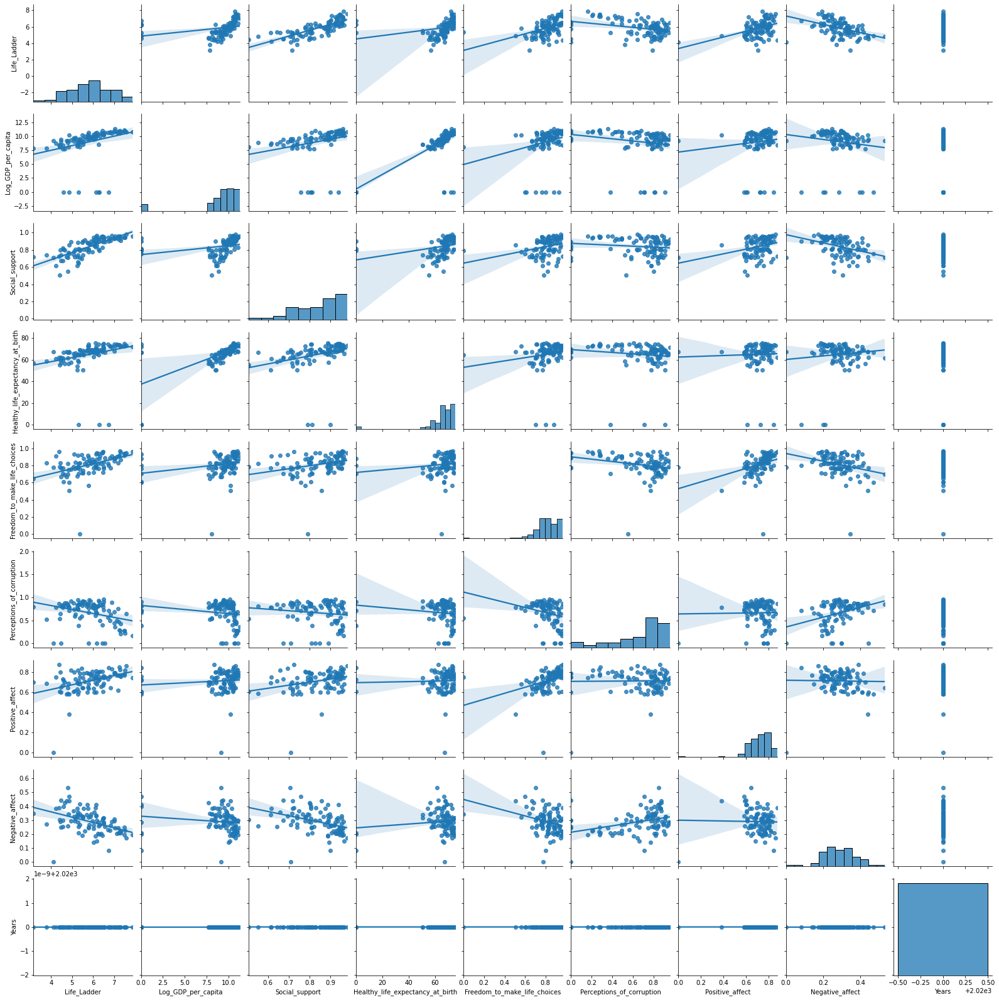

In [61]:
sns.pairplot(data=year2020,kind="reg")
plt.show()

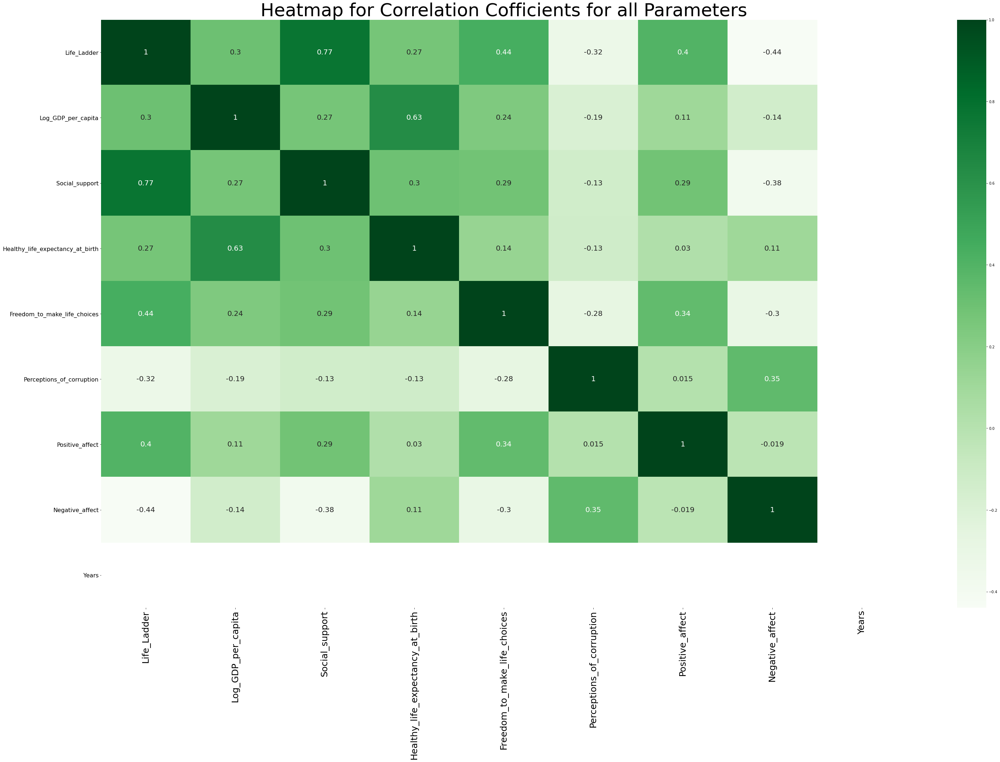

In [62]:
plt.figure(figsize=(50,30))
sns.heatmap(data=year2020.corr(), cmap='Greens', annot=True,annot_kws={"size": 20})
plt.xticks(rotation='vertical',fontsize=25); plt.yticks(rotation='horizontal',fontsize=16)
plt.title("Heatmap for Correlation Cofficients for all Parameters", fontsize=50)
plt.show()

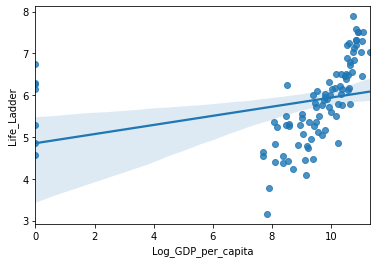

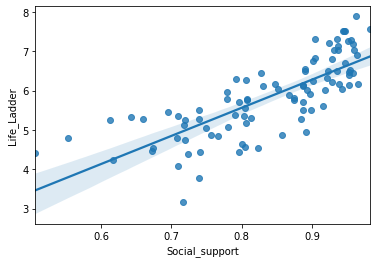

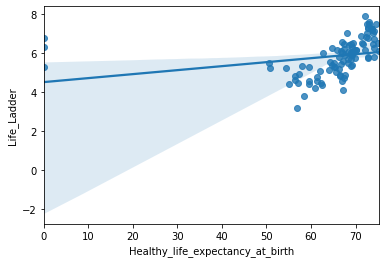

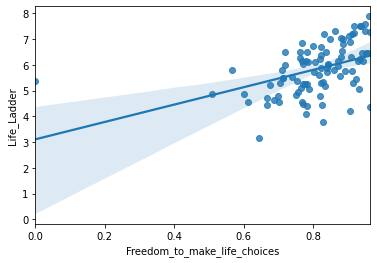

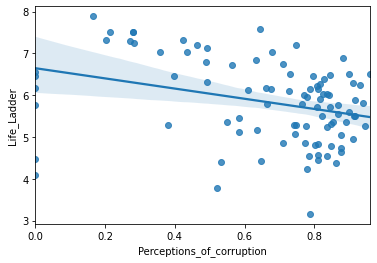

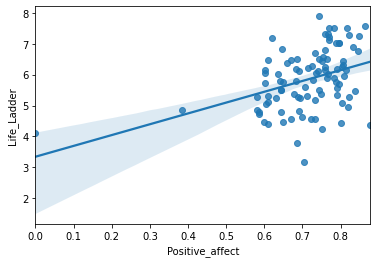

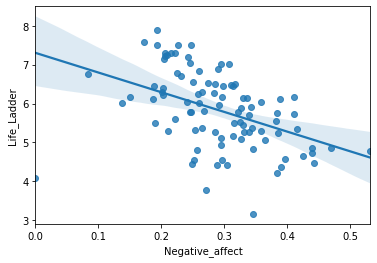

In [63]:
intercept=['Log_GDP_per_capita','Social_support','Healthy_life_expectancy_at_birth',
           'Freedom_to_make_life_choices',
           'Perceptions_of_corruption','Positive_affect','Negative_affect'] 

for i,y in enumerate(intercept):
    sns.regplot(x=intercept[i],y='Life_Ladder',data=year2020)
    plt.show()

In [64]:
year2020.head()

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2020,Albania,5.365,9.497,0.710,69.3,0.754,0.891,0.679,0.265,2020
2020,Argentina,5.901,9.850,0.897,69.2,0.823,0.816,0.764,0.342,2020
2020,Australia,7.137,10.760,0.937,74.2,0.905,0.491,0.769,0.205,2020
2020,Austria,7.213,10.851,0.925,73.6,0.912,0.464,0.769,0.206,2020
2020,Bahrain,6.173,10.620,0.848,69.7,0.945,0.000,0.790,0.297,2020


**Predicting Ladder Score based on model with interaction variable:**

In [65]:
year2020['GDP_HLE']=year2020['Log_GDP_per_capita']*year2020['Healthy_life_expectancy_at_birth']

res2020_3=smf.ols('Life_Ladder ~ Log_GDP_per_capita*Healthy_life_expectancy_at_birth', data=year2020).fit()
print('                                                       Coefficients')
print(res2020_3.params)
print('')
print('')
print('                                                       P-Values')
print(res2020_3.pvalues)


                                                       Coefficients
Intercept                                              6.067956
Log_GDP_per_capita                                    -0.889655
Healthy_life_expectancy_at_birth                      -0.013678
Log_GDP_per_capita:Healthy_life_expectancy_at_birth    0.014275
dtype: float64


                                                       P-Values
Intercept                                              8.415459e-29
Log_GDP_per_capita                                     6.184070e-14
Healthy_life_expectancy_at_birth                       5.218581e-02
Log_GDP_per_capita:Healthy_life_expectancy_at_birth    1.239388e-16
dtype: float64


In [66]:
print(res2020_3.summary())

                            OLS Regression Results                            
Dep. Variable:            Life_Ladder   R-squared:                       0.580
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     41.81
Date:                Fri, 25 Mar 2022   Prob (F-statistic):           4.46e-17
Time:                        16:13:41   Log-Likelihood:                -91.088
No. Observations:                  95   AIC:                             190.2
Df Residuals:                      91   BIC:                             200.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [67]:
def ladder_pred(x1,x2):
    x3=x1*x2
    ladder_pred=print(res2020_3.params[0]+res2020_3.params[1]*x1+res2020_3.params[2]*x2+res2020_3.params[3]*x3)
    return ladder_pred

x1=10
x2=60
print('When Log_GDP_per_capita =',x1,'and Healthy_life_expectancy_at_birth =',x2)
print('Predicted Ladder Score is:')
x=ladder_pred(x1,x2)
x


When Log_GDP_per_capita = 10 and Healthy_life_expectancy_at_birth = 60
Predicted Ladder Score is:
4.9159923949921795


In [68]:
res2020_3.conf_int(0.01)

,0,1
Intercept,5.090716,7.045196
Log_GDP_per_capita,-1.153819,-0.625490
Healthy_life_expectancy_at_birth,-0.031970,0.004614
Log_GDP_per_capita:Healthy_life_expectancy_at_birth,0.010575,0.017976


In [69]:
n=len(year2020)
t_critical=stats.t.ppf(1-(0.05/2),n-2)
t_critical

1.9858018142395026

**Anova Test:**

In [70]:
sm.stats.anova_lm(res2020_3, typ=2)

,sum_sq,df,F,PR(>F)
Log_GDP_per_capita,2.533081,1.0,6.090098,1.546379e-02
Healthy_life_expectancy_at_birth,1.027649,1.0,2.470700,1.194569e-01
Log_GDP_per_capita:Healthy_life_expectancy_at_birth,42.852857,1.0,103.027933,1.239388e-16
Residual,37.850026,91.0,NaN,NaN


**Hypothesis Testing :**

**1. Hypothesis:**
###### \begin{align}
& H_0: \text{There is} \textit{ no } \text{relationship between Healthy_life_expectancy_at_birth and Ladder Score} \\
& H_a: \text{There is} \textit{ some } \text{relationship between Healthy_life_expectancy_at_birth and Ladder Score} \\
\\
& H_0: \beta_1=0 \\
& H_a: \beta_1 \neq 0
\end{align}

**2. Significance Level**
 𝛼=0.05
 
**3. t-Test**

In [71]:
t_statistic=res2020_3.params[2]/res2020_3.bse[2]
print("t_critical = ",t_critical)
print("t_statistic = ", t_statistic)

print("Here t_statistic > t_critical is" , abs(t_statistic)>t_critical)

t_critical =  1.9858018142395026
t_statistic =  -1.967371597320597
Here t_statistic > t_critical is False


**4. Conclusion:**

Since t_statistic > t_critical is False and t_statistic is not in the rejection region, we conclude that in this model there is no relationship between Healthy_life_expectancy_at_birth and Ladder Score.

**MultiCollinearity**

In [72]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [73]:
X_variables = w[['Log_GDP_per_capita', 'Social_support',
       'Healthy_life_expectancy_at_birth', 'Freedom_to_make_life_choices',
       'Perceptions_of_corruption', 'Positive_affect', 'Negative_affect']]

In [74]:
vif_data = pd.DataFrame()
vif_data["feature"] = X_variables.columns
vif_data["VIF"] = [variance_inflation_factor(X_variables.values, i) for i in range(len(X_variables.columns))]

vif_data

,feature,VIF
0,Log_GDP_per_capita,47.726956
1,Social_support,49.645563
2,Healthy_life_expectancy_at_birth,36.642155
3,Freedom_to_make_life_choices,23.182295
4,Perceptions_of_corruption,8.255249
5,Positive_affect,15.061904
6,Negative_affect,8.354812


**Country with Highest Ladder Score Each Year:**

In [75]:
c = np.unique(w['Years'])
data=[]
for i, years in enumerate(c):
    data.append(w.loc[years][w.loc[years].Life_Ladder == w.loc[years].Life_Ladder.max()][['Country_name','Life_Ladder']])
    
print(data)

[     Country_name  Life_Ladder
year                          
2005      Denmark        8.019,      Country_name  Life_Ladder
year                          
2006      Finland        7.672,      Country_name  Life_Ladder
year                          
2007      Denmark        7.834,      Country_name  Life_Ladder
year                          
2008      Denmark        7.971,      Country_name  Life_Ladder
year                          
2009      Denmark        7.683,      Country_name  Life_Ladder
year                          
2010      Denmark        7.771,      Country_name  Life_Ladder
year                          
2011      Denmark        7.788,      Country_name  Life_Ladder
year                          
2012  Switzerland        7.776,      Country_name  Life_Ladder
year                          
2013       Canada        7.594,      Country_name  Life_Ladder
year                          
2014      Denmark        7.508,      Country_name  Life_Ladder
year                        

**Country with Lowest Ladder Score each Year:**

In [76]:
c = np.unique(w['Years'])
data1=[]
for i, years in enumerate(c):
    data1.append(w.loc[years][w.loc[years].Life_Ladder == w.loc[years].Life_Ladder.min()][['Country_name','Life_Ladder']])
    
data1

[     Country_name  Life_Ladder
 year                          
 2005       Turkey        4.719,
      Country_name  Life_Ladder
 year                          
 2006         Togo        3.202,
      Country_name  Life_Ladder
 year                          
 2007     Zimbabwe         3.28,
      Country_name  Life_Ladder
 year                          
 2008         Togo        2.808,
      Country_name  Life_Ladder
 year                          
 2009     Tanzania        3.408,
      Country_name  Life_Ladder
 year                          
 2010     Tanzania        3.229,
      Country_name  Life_Ladder
 year                          
 2011         Togo        2.936,
      Country_name  Life_Ladder
 year                          
 2012        Syria        3.164,
      Country_name  Life_Ladder
 year                          
 2013        Syria        2.688,
      Country_name  Life_Ladder
 year                          
 2014         Togo        2.839,
      Country_name  Life_Ladde

In [77]:
w[w.Life_Ladder == w.Life_Ladder.min()]

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2019,Afghanistan,2.375,7.697,0.42,52.4,0.394,0.924,0.351,0.502,2019


In [78]:
w[w.Life_Ladder == w.Life_Ladder.max()]

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2005,Denmark,8.019,10.851,0.972,69.6,0.971,0.237,0.86,0.154,2005


In [79]:
w[w.Country_name == 'Denmark']

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2005,Denmark,8.019,10.851,0.972,69.60,0.971,0.237,0.860,0.154,2005
2007,Denmark,7.834,10.891,0.954,69.92,0.932,0.206,0.828,0.194,2007
2008,Denmark,7.971,10.880,0.954,70.08,0.970,0.248,0.757,0.163,2008
2009,Denmark,7.683,10.824,0.939,70.24,0.949,0.206,0.749,0.234,2009
2010,Denmark,7.771,10.839,0.975,70.40,0.944,0.175,0.785,0.155,2010
2011,Denmark,7.788,10.848,0.962,70.62,0.935,0.220,0.769,0.175,2011
2012,Denmark,7.520,10.846,0.951,70.84,0.933,0.187,0.774,0.209,2012
2013,Denmark,7.589,10.851,0.965,71.06,0.920,0.170,0.862,0.195,2013
2014,Denmark,7.508,10.862,0.956,71.28,0.942,0.237,0.832,0.233,2014


In [80]:
w[w.Country_name == 'Venezuela']

,Country_name,Life_Ladder,Log_GDP_per_capita,Social_support,Healthy_life_expectancy_at_birth,Freedom_to_make_life_choices,Perceptions_of_corruption,Positive_affect,Negative_affect,Years
year,,,,,,,,,,
2005,Venezuela,7.170,9.313,0.955,65.40,0.838,0.720,0.819,0.233,2005
2006,Venezuela,6.525,9.460,0.946,65.46,0.798,0.646,0.859,0.178,2006
2008,Venezuela,6.258,9.701,0.922,65.58,0.678,0.776,0.802,0.224,2008
2009,Venezuela,7.189,9.542,0.945,65.64,0.677,0.828,0.825,0.180,2009
2010,Venezuela,7.478,9.717,0.932,65.70,0.768,0.754,0.862,0.130,2010
2011,Venezuela,6.580,9.822,0.931,65.74,0.766,0.772,0.828,0.199,2011
2012,Venezuela,7.067,9.826,0.932,65.78,0.804,0.743,0.858,0.176,2012
2013,Venezuela,6.553,9.739,0.896,65.82,0.642,0.837,0.840,0.238,2013
2014,Venezuela,6.136,9.557,0.904,65.86,0.570,0.827,0.811,0.244,2014
